# Applied Data Science Capstone Project
**Author**: Paul Bastide  
**Date**: 06 March 2019  
**License**: As-Is No Warranty  

The City of Boston is the largest city in Massachusetts with 800,000 inhabitants and 1.3 million commuters. The city provides insights on the locations of neighborhoods, fatalities and incidents. 

This project identifies incident hotspot neighborhoods and suggests less incident prone neighborhoods of travel for users. The project helps Boston cyclists be better prepared to travel in the neighborhoods they pass through. Given the appropriate data, the problem is:  
- What level of risk is there in commuting through the Boston neighborhoods and streets to avoid?


In [1]:
###################################################################################################
# Installation of Dependencies (incase they do not exist on the test system)
###################################################################################################

# geojson to process the GIS data
!pip3 install geojson

#http://geopandas.org/
!pip3 install git+git://github.com/geopandas/geopandas.git

  Cloning git://github.com/geopandas/geopandas.git to /private/var/folders/07/sw3n5r3170q202d5j4tx8fhw0000gn/T/pip-req-build-np_n1i7d
  Running setup.py bdist_wheel for geopandas ... done
  Stored in directory: /private/var/folders/07/sw3n5r3170q202d5j4tx8fhw0000gn/T/pip-ephem-wheel-cache-4x21bqib/wheels/91/24/71/376c9c67192694168352afcccc2d264248f7e2cc6192997186
Successfully built geopandas
  Found existing installation: geopandas 0.4.0+56.gca3216e
    Uninstalling geopandas-0.4.0+56.gca3216e:
      Successfully uninstalled geopandas-0.4.0+56.gca3216e


In [367]:
###################################################################################################
# Imports used in the analysis of the neighborhood data and the geojson data 
###################################################################################################

# imported to retrieve any secondary data
import requests

# import pandas to process the data (and json_normalize to use the geojson as a plain dataframe)
import pandas as pd
from pandas.io.json import json_normalize
import numpy as np

# Import to control the output of the choropleth map
import matplotlib.cm as cm
import matplotlib.colors as colors

# standard matplot lib 
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.dates as mdates

# Import Folium to visualize the map
import folium
from folium import plugins
from folium.plugins import HeatMap
from folium.plugins import MarkerCluster

# Import the GeoPandas utility to process / use establish the polygon area
import geopandas 

# figures out the neighborhoods for each coordinate. 
from shapely.geometry import Point 
#(switched to geojson point to more precisely identify location)
#from geojson import Point

# Imports the Clustering Utilities
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.datasets.samples_generator import make_blobs
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

print("All imports complete")

All imports complete


In [5]:
###################################################################################################
# Files used in the analysis
###################################################################################################

file_boston_geo = 'boston/Boston_Neighborhoods.geojson'
file_boston_fatal = 'boston/fatality_open_data.csv'
file_boston_crash = 'boston/crash_open_data.csv'

###################################################################################################
# Boston Lat / Longitude from https://www.latlong.net/place/boston-ma-usa-18552.html
# altered to fit the maximal part at the 12 zoom level on the screen (the lat is rounded down)
###################################################################################################
boston = [ 42.3200, -71.0589]

print("fixed values set")

fixed values set


In [40]:
###################################################################################################
# show boston neighborhood polygons on the map with the various neighborhoods
###################################################################################################
map_boston = folium.Map(location=boston, zoom_start=12)
folium.GeoJson(file_boston_geo, name='geojson').add_to(map_boston)
map_boston

In [25]:
###################################################################################################
# Retrieve the List of Neighborhoods and Count
###################################################################################################
df_neighborhood = pd.read_json(file_boston_geo)
df_neighborhood_norm = json_normalize(df_neighborhood['features'])

df_neighborhood_names = pd.DataFrame(data=df_neighborhood_norm['properties.Name'].unique(),columns=['neighborhood'])

print('================================')
print('The Neighborhoods in Boston are: ')
print('================================')
print(df_neighborhood_names.head(30))
print('================================')
print('The total number of neighborhoods are: ',df_neighborhood_norm['properties.Name'].unique().size)

The Neighborhoods in Boston are: 
               neighborhood
0                Roslindale
1             Jamaica Plain
2              Mission Hill
3                  Longwood
4               Bay Village
5          Leather District
6                 Chinatown
7                 North End
8                   Roxbury
9                 South End
10                 Back Bay
11              East Boston
12              Charlestown
13                 West End
14              Beacon Hill
15                 Downtown
16                   Fenway
17                 Brighton
18             West Roxbury
19                Hyde Park
20                 Mattapan
21               Dorchester
22  South Boston Waterfront
23             South Boston
24                  Allston
25           Harbor Islands
The total number of neighborhoods are:  26


# Prepare the Neighborhood Polygons
The polygons are used to position, based on lat/long the incident locations for each bike incident.

In [49]:
####################################################################################################
# load the neighborhoods and the relevant polygons
# display the top 30 (there are only 26, so there should only be 26 polygons)
####################################################################################################

df_geo = geopandas.read_file(file_boston_geo)
df_geo.head(30)

,OBJECTID,Name,Acres,Neighborhood_ID,SqMiles,ShapeSTArea,ShapeSTLength,geometry
0,27,Roslindale,1605.568237,15,2.51,6.993827e+07,53563.912597,(POLYGON ((-71.12592717485386 42.2720131079574...
1,28,Jamaica Plain,2519.245394,11,3.94,1.097379e+08,56349.937161,POLYGON ((-71.10499218689807 42.32610168280807...
2,29,Mission Hill,350.853564,13,0.55,1.528312e+07,17918.724113,"POLYGON ((-71.0904343142608 42.33576996328494,..."
3,30,Longwood,188.611947,28,0.29,8.215904e+06,11908.757148,POLYGON ((-71.09810894210769 42.33673037764089...
4,31,Bay Village,26.539839,33,0.04,1.156071e+06,4650.635493,POLYGON ((-71.06662924918761 42.34878268384542...
5,32,Leather District,15.639908,27,0.02,6.812717e+05,3237.140537,POLYGON ((-71.05837839326242 42.34983109288108...
6,33,Chinatown,76.324410,26,0.12,3.324678e+06,9736.590413,POLYGON ((-71.05790551476029 42.35237863170756...
7,34,North End,126.910439,14,0.20,5.527506e+06,16177.826815,POLYGON ((-71.05199523849357 42.36883599550553...
8,35,Roxbury,2108.469072,16,3.29,9.184455e+07,49488.800485,POLYGON ((-71.09645963695638 42.29323314655063...
9,36,South End,471.535356,32,0.74,2.054000e+07,17912.333569,POLYGON ((-71.06834052286473 42.34775054070596...


In [139]:
####################################################################################################
# uncover the centroid locations for the polygons // neighborhood boundaries
####################################################################################################

print(df_geo.geometry.centroid)

0      POINT (-71.1266625924455 42.28252393711167)
1     POINT (-71.11509694295383 42.30776950334869)
2     POINT (-71.10260665285719 42.33174148832993)
3     POINT (-71.10510267838998 42.33860887964641)
4     POINT (-71.06903199875553 42.34910324469212)
5     POINT (-71.05782809420246 42.35098294510252)
6     POINT (-71.06166205339723 42.34902733391331)
7     POINT (-71.05385774051845 42.36546472625824)
8      POINT (-71.08664322574298 42.3185185721261)
9     POINT (-71.07136929528555 42.34135040493361)
10    POINT (-71.08053536425713 42.34986052367715)
11    POINT (-71.01569537575438 42.37267857008496)
12    POINT (-71.06376664747465 42.37931017410277)
13    POINT (-71.06559037325432 42.36466834174527)
14    POINT (-71.06826236662873 42.35705004021355)
15    POINT (-71.05765065737081 42.35559317798793)
16    POINT (-71.09611485698133 42.34476716848734)
17     POINT (-71.1549354228525 42.34835670242801)
18     POINT (-71.1600269089934 42.28064227387578)
19    POINT (-71.12629868045502

# Scenario 1 - Analyze the Fatalities per Neighborhood

In [119]:
###################################################################################################
# load the df_fatal data set and display the columns / head
###################################################################################################

df_fatal = pd.read_csv(file_boston_fatal,index_col=None)
df_fatal.head()

,date_time,mode_type,location_type,street,xstreet1,xstreet2,x_cord,y_cord,long,lat
0,2015-01-21 15:07:00,ped,Street,CENTRE ST,RITCHIE ST,LAMARTINE ST,764320.75,2942908.64,-71.100069,42.322788
1,2015-04-09 16:00:00,ped,Intersection,NaN,MELNEA CASS BLVD,MASSACHUSETTS AVE,771859.87,2946498.89,-71.072124,42.332547
2,2015-04-25 17:48:00,mv,Street,MASSACHUSETTS AVE,MAGAZINE ST,PROCTOR ST,773210.41,2944795.50,-71.067587,42.327660
3,2015-05-07 06:30:00,ped,Street,BLUE HILL AVE,BABSON ST,FAIRWAY ST,766045.15,2923666.84,-71.093803,42.269966
4,2015-05-19 06:01:00,bike,Intersection,NaN,NEW ENGLAND AVE,TALBOT AVE,770568.29,2931627.61,-71.077173,42.291757


In [120]:
###################################################################################################
# Check the mix of mode_types
# ped/mv are not the focus of the analysis, but good to check
###################################################################################################

print('List of mode_types and the correponding counts of fatalities: ')
print(df_fatal['mode_type'].value_counts())

List of mode_types and the correponding counts of fatalities: 
ped     38
mv      21
bike     6
Name: mode_type, dtype: int64


In [121]:
####################################################################################################
# drop any non bike incident and check the total number of rows. 
####################################################################################################

df_fatal = df_fatal.loc[df_fatal['mode_type'] == 'bike']
print("The total number of entries in the new data frame are: ")
print(df_fatal['mode_type'].value_counts())

The total number of entries in the new data frame are: 
bike    6
Name: mode_type, dtype: int64


In [134]:
####################################################################################################
# What are the location types for the incidents
####################################################################################################

df_fatal['location_type'].value_counts()

Street          3
Intersection    3
Name: location_type, dtype: int64

In [137]:
####################################################################################################
# Add Neighborhood to the df_fatal data frames 
# pinpoint the neighborhood in the polygon 
####################################################################################################

# Creates a new column and then check each incident's column     
# Total Computation = 26 Neighborhoods * 6 fatalities
df_fatal['neighborhood'] = ''

df_fatal['date_time']=pd.to_datetime(df_fatal['date_time'])
df_fatal['long']=df_fatal['long'].astype(float)
df_fatal['lat']=df_fatal['lat'].astype(float)
df_fatal.set_index('mode_type')

for name, geo in zip(df_geo['Name'], df_geo['geometry']):
    col_name = name
    for row in df_fatal.itertuples(index=True):
        index = row.Index
        lat_inc = row.lat
        long_inc = row.long

        incident = Point(long_inc, lat_inc)
        if(geo.contains(incident)): 
           df_fatal.loc[index,'neighborhood'] = name

print("------------------------------------")
print("The Fatalities with the neighborhood labels: ")
df_fatal.head()

------------------------------------
The Fatalities with the neighborhood labels: 


,date_time,mode_type,location_type,street,xstreet1,xstreet2,x_cord,y_cord,long,lat,neighborhood
4,2015-05-19 06:01:00,bike,Intersection,NaN,NEW ENGLAND AVE,TALBOT AVE,770568.29,2931627.61,-71.077173,42.291757,Dorchester
5,2015-06-06 07:03:00,bike,Street,SELDEN ST,LENA TER,WOODDALE AVE,768323.40,2926404.87,-71.085761,42.277554,Mattapan
12,2015-08-07 03:05:00,bike,Intersection,NaN,BEACON ST,MASSACHUSETTS AVE,767133.97,2953148.66,-71.089484,42.350858,Back Bay
35,2016-11-08 04:59:00,bike,Street,CAMBRIDGE ST,DUSTIN ST,WARREN ST,751610.34,2952969.16,-71.146741,42.350317,Allston
48,2017-04-29 23:19:00,bike,Intersection,NaN,CLARENDON ST,COMMONWEALTH AVE,770731.60,2953817.16,-71.076162,42.352644,Back Bay


In [138]:
####################################################################################################
# What are the neighborhoods with the highest number of fatalities? 
####################################################################################################

df_fatal['neighborhood'].value_counts()

Back Bay      2
Dorchester    2
Allston       1
Mattapan      1
Name: neighborhood, dtype: int64

In [388]:
###################################################################################################
# Scenario 1: All Time (Neighborhood Level) --- show the fatalities per neighborhood
###################################################################################################

# Sort the values in place to make a more linear addition to the marker clusters
df_fatal.sort_values('neighborhood',inplace=True, ascending=False)

# zoom 11 is used to show the groupings
map_fatal = folium.Map(location=boston, zoom_start=11)

# Quick Add the Marker_Clusters and Add the Incidents to the marker clusters
marker_cluster = ""
prior_neighborhood = ""
for row in df_fatal.itertuples(index=True):
        lat_inc = row.lat
        long_inc = row.long
        neighborhood = row.neighborhood
        
        # Conditionally creates a marker cluster when there is no existing marker cluster 
        # or the prior_neighborhood does not match
        if marker_cluster == "" or prior_neighborhood != neighborhood: 
            print("Creating a new Marker Cluster for neighborhood: " + neighborhood )
            marker_cluster = MarkerCluster(name = neighborhood,overlay=True, control=False, icon_create_function=None)
        
        marker = folium.Marker(location=[lat_inc, long_inc],icon=folium.Icon(color='red',icon='remove-sign'))
        popup = '{}'.format(neighborhood)    
        folium.Popup(popup).add_to(marker)
        marker.add_to(marker_cluster)
        marker_cluster.add_to(map_fatal)
        
        # Set so it runs only one time
        prior_neighborhood = neighborhood

map_fatal

Creating a new Marker Cluster for neighborhood: Mattapan
Creating a new Marker Cluster for neighborhood: Dorchester
Creating a new Marker Cluster for neighborhood: Back Bay
Creating a new Marker Cluster for neighborhood: Allston


# Scenario 2: Fatalities By Year and Month

Results of the new column look like this: 


,date_time,mode_type,location_type,street,xstreet1,xstreet2,x_cord,y_cord,long,lat,neighborhood,year-month
5,2015-06-06 07:03:00,bike,Street,SELDEN ST,LENA TER,WOODDALE AVE,768323.40,2926404.87,-71.085761,42.277554,Mattapan,2015-06
4,2015-05-19 06:01:00,bike,Intersection,NaN,NEW ENGLAND AVE,TALBOT AVE,770568.29,2931627.61,-71.077173,42.291757,Dorchester,2015-05
52,2017-11-03 09:53:00,bike,Street,COTTAGE ST,ROBEY ST,NORFOLK AVE,773096.72,2942360.28,-71.067626,42.321272,Dorchester,2017-11
12,2015-08-07 03:05:00,bike,Intersection,NaN,BEACON ST,MASSACHUSETTS AVE,767133.97,2953148.66,-71.089484,42.350858,Back Bay,2015-08
48,2017-04-29 23:19:00,bike,Intersection,NaN,CLARENDON ST,COMMONWEALTH AVE,770731.60,2953817.16,-71.076162,42.352644,Back Bay,2017-04


Graphing for neighborhood:  Roslindale
Graphing for neighborhood:  Jamaica Plain
Graphing for neighborhood:  Mission Hill
Graphing for neighborhood:  Longwood
Graphing for neighborhood:  Bay Village
Graphing for neighborhood:  Leather District
Graphing for neighborhood:  Chinatown
Graphing for neighborhood:  North End


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Graphing for neighborhood:  Roxbury
Graphing for neighborhood:  South End
Graphing for neighborhood:  Back Bay
Graphing for neighborhood:  East Boston
Graphing for neighborhood:  Charlestown
Graphing for neighborhood:  West End
Graphing for neighborhood:  Beacon Hill
Graphing for neighborhood:  Downtown
Graphing for neighborhood:  Fenway
Graphing for neighborhood:  Brighton
Graphing for neighborhood:  West Roxbury
Graphing for neighborhood:  Hyde Park
Graphing for neighborhood:  Mattapan
Graphing for neighborhood:  Dorchester
Graphing for neighborhood:  South Boston Waterfront
Graphing for neighborhood:  South Boston
Graphing for neighborhood:  Allston
Graphing for neighborhood:  Harbor Islands


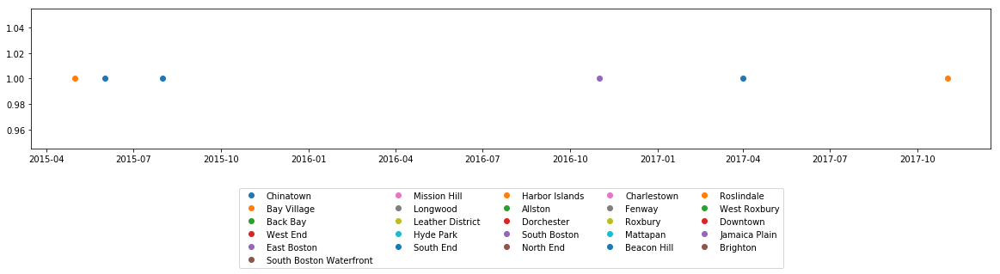

In [387]:
###################################################################################################
# Scenario 2: By Year (Color Different years/ show a gradient?) 
###################################################################################################
# use a line graph - the neighborhoods are separate 
# split the data into buckets year-month
# X axis is time
# Y axis is incident numbers
# Line on X-Y is neighborhood 

# adds the year-month to the df_fatal (this simplifies occurence on the same date)
df_fatal['year-month'] = df_fatal['date_time'].dt.to_period('M')
print("Results of the new column look like this: ")
display(df_fatal.head())

# Reset the size to the useful area in the notebook (for me 20,3 works well)
plt.rcParams["figure.figsize"] = (20,3)

# https://python-graph-gallery.com/122-multiple-lines-chart/ 
df_ym_n = df_fatal[['neighborhood','year-month','date_time']]
df_ym_n['date_time'] = pd.to_datetime(df_ym_n['year-month'].astype(str),format='%Y-%m')
df_ym_n = df_ym_n.groupby(['date_time','neighborhood']).size().reset_index(name='count')

years = mdates.YearLocator()    
months = mdates.MonthLocator() 
yearsFmt = mdates.DateFormatter('%Y')
ax.plot(start='2015-01-01',end='2018-12-31' )

# Configure the formatted output
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(yearsFmt)
ax.xaxis.set_minor_locator(months)

legends = set()

#### Loop over this. 
for neighborhood in df_geo['Name']:
    print("Graphing for neighborhood: " , neighborhood)
    legends.add(neighborhood)
    df_ym_neighborhood = df_fatal.loc[df_fatal['neighborhood'] == neighborhood]
    df_ym_neighborhood = df_ym_neighborhood[['neighborhood','year-month','date_time']]
    df_ym_neighborhood['date_time'] = pd.to_datetime(df_ym_neighborhood['year-month'].astype(str),format='%Y-%m')
    df_ym_neighborhood = df_ym_neighborhood.groupby(['date_time','neighborhood']).size().reset_index(name='count')
    plt.plot_date(df_ym_neighborhood['date_time'], df_ym_neighborhood['count'])
    #plt.scatter(matplotlib.dates.date2num(df_ym_neighborhood['date_time']),df_ym_neighborhood['count'])
    
# outputs the plot
plt.legend(legends, loc='upper center', bbox_to_anchor=(0.5, -0.25),
          fancybox=True, shadow=False, ncol=5)  

## Comment on Regression Line
A regression line would not provide any additional insight as the particular events are infrequent (while important and fatal). 


# Scenario 3: Analyze the Non-Fatal Traffic Incidents by Neighborhood

In [394]:
###################################################################################################
# load the df_crash data set and display the columns / head
###################################################################################################

df_crash = pd.read_csv(file_boston_crash,index_col=None)
print('Head of the crash dataframe is: ')
display(df_crash.head())

Head of the crash dataframe is: 


,dispatch_ts,mode_type,location_type,street,xstreet1,xstreet2,x_cord,y_cord,lat,long
0,2015-01-01 00:24:27,mv,Intersection,NaN,TRAIN ST,WESTGLOW ST,777243.68,2930930.11,42.289750,-71.052515
1,2015-01-01 03:50:33,mv,Street,RIVER ST,WALTER ST,WINTHROP ST,758927.71,2918981.60,42.257081,-71.120111
2,2015-01-01 10:14:13,ped,Intersection,NaN,LONDON ST,MERIDIAN ST,780725.19,2961410.17,42.373337,-71.039040
3,2015-01-01 18:23:57,bike,Intersection,NaN,OLNEY ST,INWOOD ST,772710.48,2936614.62,42.305413,-71.069163
4,2015-01-01 18:42:19,ped,Intersection,NaN,WASHINGTON ST,COLUMBUS AVE,764813.61,2940364.63,42.315809,-71.098290


In [395]:
###################################################################################################
# Check the mix of mode_types
# ped/mv are not the focus of the analysis, but good to check
###################################################################################################

print('List of mode_types and the correponding counts of incidents: ')
print(df_crash['mode_type'].value_counts())

List of mode_types and the correponding counts of incidents: 
mv      12489
ped      3131
bike     1741
Name: mode_type, dtype: int64


In [396]:
####################################################################################################
# drop any non bike incident and check the total number of rows. 
####################################################################################################

df_crash = df_crash.loc[df_crash['mode_type'] == 'bike']
print("The total number of entries in the new data frame are: ")
print(df_crash['mode_type'].value_counts())

The total number of entries in the new data frame are: 
bike    1741
Name: mode_type, dtype: int64


In [399]:
####################################################################################################
# Add Neighborhood to the df_crash data frames 
# pinpoint the neighborhood in the polygon 
####################################################################################################

# Creates a new column and then check each incident's column     
# Total Computation = 26 Neighborhoods * 1741 incidents
df_crash['neighborhood'] = ''

df_crash['dispatch_ts']=pd.to_datetime(df_crash['dispatch_ts'])
df_crash['long']=df_crash['long'].astype(float)
df_crash['lat']=df_crash['lat'].astype(float)
df_crash.set_index('mode_type')

for name, geo in zip(df_geo['Name'], df_geo['geometry']):
    col_name = name
    for row in df_crash.itertuples(index=True):
        index = row.Index
        lat_inc = row.lat
        long_inc = row.long

        incident = Point(long_inc, lat_inc)
        if(geo.contains(incident)): 
           df_crash.loc[index,'neighborhood'] = name

print("------------------------------------")
print("The incidents with the neighborhood labels: ")
df_crash.head()

------------------------------------
The incidents with the neighborhood labels: 


,dispatch_ts,mode_type,location_type,street,xstreet1,xstreet2,x_cord,y_cord,lat,long,neighborhood
3,2015-01-01 18:23:57,bike,Intersection,NaN,OLNEY ST,INWOOD ST,772710.48,2936614.62,42.305413,-71.069163,Dorchester
12,2015-01-02 22:27:44,bike,Street,KENSINGTON ST,DEAD END,ELMORE ST,766791.85,2942087.73,42.320627,-71.091100,Roxbury
26,2015-01-05 08:08:13,bike,Street,TERRACE ST,ALLEGHANY ST,CEDAR ST,764920.29,2945047.13,42.328736,-71.098057,Mission Hill
30,2015-01-05 12:00:18,bike,Street,DORCHESTER AVE,ADAMS ST,ADAMS ST,775335.45,2935310.10,42.301827,-71.059719,Dorchester
104,2015-01-12 13:28:03,bike,Intersection,NaN,COMMONWEALTH AVE,HARVARD AVE,755895.54,2952987.13,42.350556,-71.131062,Allston


In [400]:
####################################################################################################
# What are the neighborhoods with the highest number of incidents? 
####################################################################################################

df_crash['neighborhood'].value_counts()

Dorchester                 280
Roxbury                    204
Jamaica Plain              139
Allston                    136
Back Bay                   131
Fenway                     115
Brighton                   105
Downtown                    87
South End                   80
South Boston                75
Mission Hill                57
Charlestown                 43
Beacon Hill                 37
Roslindale                  35
East Boston                 34
Mattapan                    30
Hyde Park                   26
West End                    24
South Boston Waterfront     22
West Roxbury                21
North End                   17
Chinatown                   16
Longwood                    15
                             6
Leather District             3
Bay Village                  3
Name: neighborhood, dtype: int64

In [401]:
###################################################################################################
# Scenario 3: All Time (Neighborhood Level) --- show the non-fatalities per neighborhood
###################################################################################################

# Sort the values in place to make a more linear addition to the marker clusters
df_crash.sort_values('neighborhood',inplace=True, ascending=False)

# zoom 11 is used to show the groupings
map_crash = folium.Map(location=boston, zoom_start=11)

# Quick Add the Marker_Clusters and Add the Incidents to the marker clusters
marker_cluster = ""
prior_neighborhood = ""
for row in df_crash.itertuples(index=True):
        lat_inc = row.lat
        long_inc = row.long
        neighborhood = row.neighborhood
        
        # Conditionally creates a marker cluster when there is no existing marker cluster 
        # or the prior_neighborhood does not match
        if marker_cluster == "" or prior_neighborhood != neighborhood: 
            print("Creating a new Marker Cluster for neighborhood: " + neighborhood )
            marker_cluster = MarkerCluster(name = neighborhood,overlay=True, control=False, icon_create_function=None)
        
        marker = folium.Marker(location=[lat_inc, long_inc],icon=folium.Icon(color='red',icon='remove-sign'))
        popup = '{}'.format(neighborhood)    
        folium.Popup(popup).add_to(marker)
        marker.add_to(marker_cluster)
        marker_cluster.add_to(map_crash)
        
        # Set so it runs only one time
        prior_neighborhood = neighborhood

map_crash

Creating a new Marker Cluster for neighborhood: West Roxbury
Creating a new Marker Cluster for neighborhood: West End
Creating a new Marker Cluster for neighborhood: South End
Creating a new Marker Cluster for neighborhood: South Boston Waterfront
Creating a new Marker Cluster for neighborhood: South Boston
Creating a new Marker Cluster for neighborhood: Roxbury
Creating a new Marker Cluster for neighborhood: Roslindale
Creating a new Marker Cluster for neighborhood: North End
Creating a new Marker Cluster for neighborhood: Mission Hill
Creating a new Marker Cluster for neighborhood: Mattapan
Creating a new Marker Cluster for neighborhood: Longwood
Creating a new Marker Cluster for neighborhood: Leather District
Creating a new Marker Cluster for neighborhood: Jamaica Plain
Creating a new Marker Cluster for neighborhood: Hyde Park
Creating a new Marker Cluster for neighborhood: Fenway
Creating a new Marker Cluster for neighborhood: East Boston
Creating a new Marker Cluster for neighborh

# Scenario 4: Non-Fatal Traffic Incidents By Year-Month

Results of the new column look like this: 


,dispatch_ts,mode_type,location_type,street,xstreet1,xstreet2,x_cord,y_cord,lat,long,neighborhood,year-month
3454,2015-11-04 09:12:57,bike,Street,CENTRE ST,MCKENNA TER,BIRD PL,749113.24,2928717.43,42.284084,-71.156866,West Roxbury,2015-11
16848,2018-11-15 15:36:56,bike,Street,MANTHORNE RD,PIERPONT RD,CENTRE ST,750928.62,2930054.95,42.287705,-71.150004,West Roxbury,2018-11
16269,2018-10-03 13:46:43,bike,Intersection,NaN,BAKER ST,VFW PKWY,745028.45,2929953.95,42.287473,-71.171591,West Roxbury,2018-10
5509,2016-05-08 17:34:11,bike,Street,WEST ROXBURY PKWY,PEAK HILL RD,WELD ST,752081.26,2932020.31,42.293351,-71.145974,West Roxbury,2016-05
14833,2018-06-11 22:05:49,bike,Intersection,NaN,WASHINGTON ST,WEYMOUTH AVE,750418.09,2922202.52,42.266144,-71.151790,West Roxbury,2018-06


Graphing for neighborhood:  Roslindale


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Graphing for neighborhood:  Jamaica Plain
Graphing for neighborhood:  Mission Hill
Graphing for neighborhood:  Longwood
Graphing for neighborhood:  Bay Village
Graphing for neighborhood:  Leather District
Graphing for neighborhood:  Chinatown
Graphing for neighborhood:  North End
Graphing for neighborhood:  Roxbury
Graphing for neighborhood:  South End
Graphing for neighborhood:  Back Bay
Graphing for neighborhood:  East Boston
Graphing for neighborhood:  Charlestown
Graphing for neighborhood:  West End
Graphing for neighborhood:  Beacon Hill
Graphing for neighborhood:  Downtown
Graphing for neighborhood:  Fenway
Graphing for neighborhood:  Brighton
Graphing for neighborhood:  West Roxbury
Graphing for neighborhood:  Hyde Park
Graphing for neighborhood:  Mattapan
Graphing for neighborhood:  Dorchester
Graphing for neighborhood:  South Boston Waterfront
Graphing for neighborhood:  South Boston
Graphing for neighborhood:  Allston
Graphing for neighborhood:  Harbor Islands


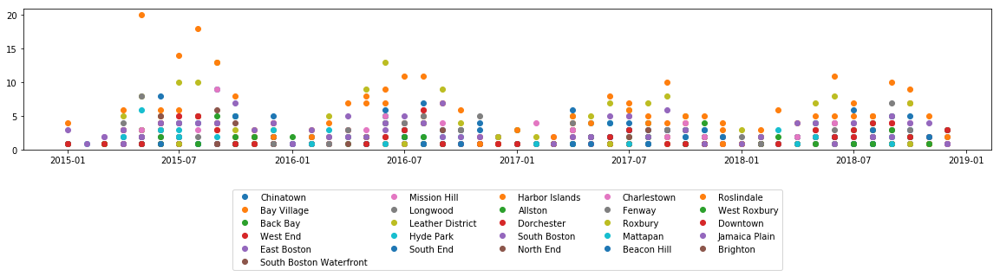

In [405]:
###################################################################################################
# Scenario 4: By Year (Color Different years/ show a gradient?) 
###################################################################################################
# use a line graph - the neighborhoods are separate 
# split the data into buckets year-month
# X axis is time
# Y axis is incident numbers
# Line on X-Y is neighborhood 

# adds the year-month to the df_fatal (this simplifies occurence on the same date)
df_crash['year-month'] = df_crash['dispatch_ts'].dt.to_period('M')
print("Results of the new column look like this: ")
display(df_crash.head())

# Reset the size to the useful area in the notebook (for me 20,3 works well)
plt.rcParams["figure.figsize"] = (20,3)

# https://python-graph-gallery.com/122-multiple-lines-chart/ 
df_ym_n = df_crash[['neighborhood','year-month','dispatch_ts']]
df_ym_n['date_time'] = pd.to_datetime(df_crash['year-month'].astype(str),format='%Y-%m')
df_ym_n = df_ym_n.groupby(['dispatch_ts','neighborhood']).size().reset_index(name='count')

years = mdates.YearLocator()    
months = mdates.MonthLocator() 
yearsFmt = mdates.DateFormatter('%Y')
ax.plot(start='2015-01-01',end='2018-12-31' )

# Configure the formatted output
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(yearsFmt)
ax.xaxis.set_minor_locator(months)

legends = set()

#### Loop over this. 
for neighborhood in df_geo['Name']:
    print("Graphing for neighborhood: " , neighborhood)
    legends.add(neighborhood)
    df_ym_neighborhood = df_crash.loc[df_crash['neighborhood'] == neighborhood]
    df_ym_neighborhood = df_ym_neighborhood[['neighborhood','year-month','dispatch_ts']]
    df_ym_neighborhood['dispatch_ts'] = pd.to_datetime(df_ym_neighborhood['year-month'].astype(str),format='%Y-%m')
    df_ym_neighborhood = df_ym_neighborhood.groupby(['dispatch_ts','neighborhood']).size().reset_index(name='count')
    plt.plot_date(df_ym_neighborhood['dispatch_ts'], df_ym_neighborhood['count'])
    #plt.scatter(matplotlib.dates.date2num(df_ym_neighborhood['date_time']),df_ym_neighborhood['count'])
    
# outputs the plot
plt.legend(legends, loc='upper center', bbox_to_anchor=(0.5, -0.25),
          fancybox=True, shadow=False, ncol=5)  

# Scenario 5: Recommended Neighborhoods to Travel 

In [430]:
###################################################################################################
# Show the incident markers on the map (non-fatal)
###################################################################################################
# Display a choropleth image showing the inesnity of the data
# Link to Color Scheme - https://github.com/python-visualization/folium/blob/v0.2.0/folium/utilities.py#L104
map_boston_crash = folium.Map(location=boston, zoom_start=11)
folium.GeoJson(file_boston_geo, name='geojson').add_to(map_boston_crash)
map_boston_crash

for lat, lng in zip(df_crash['lat'], df_crash['long']):
    
    if not np.isnan(lat):
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            color='orange',
            fill=True,
            fill_color='white',
            fill_opacity=0.25).add_to(map_boston_crash)      
    
map_boston_crash

In [433]:
###################################################################################################
# Show the incident markers on the map (non-fatal)
###################################################################################################

# slim down the data to what we need
df_cluster = df_crash.drop('dispatch_ts',1)
df_cluster = df_cluster.drop('mode_type',1)
df_cluster = df_cluster.drop('location_type',1)
df_cluster = df_cluster.drop('street',1)
df_cluster = df_cluster.drop('xstreet1',1)
df_cluster = df_cluster.drop('xstreet2',1)
df_cluster = df_cluster.drop('x_cord',1)
df_cluster = df_cluster.drop('y_cord',1)
df_cluster = df_cluster.drop('neighborhood',1)
df_cluster = df_cluster.drop('year-month',1)
df_cluster['long']=df_cluster['long'].astype(float)
df_cluster['lat']=df_cluster['lat'].astype(float)

display(df_cluster.head())

# cluster numbers (Create a bunch, we want to see the highest concentraitions)
kclusters = 50

# k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(df_cluster)

# Size of the Shape (results 0 to the top of the kclusters) 1713
kmeans.labels_[0:1741] 

# Insert the Cluster Labels
df_cluster = df_crash
df_cluster.insert(0, 'Cluster Label', kmeans.labels_)
df_cluster

,lat,long
3454,42.284084,-71.156866
16848,42.287705,-71.150004
16269,42.287473,-71.171591
5509,42.293351,-71.145974
14833,42.266144,-71.151790


,Cluster Label,dispatch_ts,mode_type,location_type,street,xstreet1,xstreet2,x_cord,y_cord,lat,long,neighborhood,year-month
3454,15,2015-11-04 09:12:57,bike,Street,CENTRE ST,MCKENNA TER,BIRD PL,749113.24,2928717.43,42.284084,-71.156866,West Roxbury,2015-11
16848,15,2018-11-15 15:36:56,bike,Street,MANTHORNE RD,PIERPONT RD,CENTRE ST,750928.62,2930054.95,42.287705,-71.150004,West Roxbury,2018-11
16269,15,2018-10-03 13:46:43,bike,Intersection,NaN,BAKER ST,VFW PKWY,745028.45,2929953.95,42.287473,-71.171591,West Roxbury,2018-10
5509,15,2016-05-08 17:34:11,bike,Street,WEST ROXBURY PKWY,PEAK HILL RD,WELD ST,752081.26,2932020.31,42.293351,-71.145974,West Roxbury,2016-05
14833,15,2018-06-11 22:05:49,bike,Intersection,NaN,WASHINGTON ST,WEYMOUTH AVE,750418.09,2922202.52,42.266144,-71.151790,West Roxbury,2018-06
11589,10,2017-09-17 09:11:22,bike,Intersection,NaN,CENTRE ST,WELD ST,754640.57,2932533.87,42.294446,-71.136027,West Roxbury,2017-09
5871,15,2016-06-06 10:57:46,bike,Street,VFW PKWY,LILLIE WAY,CLEARWATER RD,751553.22,2933435.72,42.296612,-71.147410,West Roxbury,2016-06
8205,15,2016-12-06 12:18:23,bike,Intersection,NaN,LANDSEER ST,CENTRE ST,748602.81,2927265.35,42.280057,-71.158421,West Roxbury,2016-12
2084,15,2015-07-23 14:07:50,bike,Street,SPRING ST,LEDGE HILL RD,GOULD ST,745391.34,2924741.48,42.273286,-71.170494,West Roxbury,2015-07
6318,15,2016-07-11 03:08:54,bike,Street,CENTRE ST,LAGRANGE ST,LANDSEER ST,748587.98,2927370.60,42.280288,-71.158265,West Roxbury,2016-07


In [435]:
###################################################################################################
# Map the clusters
###################################################################################################
map_clusters = folium.Map(location=boston, zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(df_cluster['lat'], df_cluster['long'], df_cluster['neighborhood'], df_cluster['Cluster Label']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [444]:
###################################################################################################
# aggregates the neighborhood occurences by cluster and calculates the total clusters per neighborhood
###################################################################################################
df_cluster_x = df_cluster.groupby(['neighborhood','Cluster Label']).size().reset_index(name='count')

print("The Total Cluster Count for each neighborhood: ")
display(df_cluster_x.groupby(['neighborhood']).size().reset_index(name='count').sort_values('count', ascending=False))

The Total Cluster Count for each neighborhood: 


,neighborhood,count
8,Dorchester,12
20,Roxbury,11
13,Jamaica Plain,8
1,Allston,6
21,South Boston,5
11,Fenway,5
0,,5
5,Brighton,5
16,Mattapan,4
4,Beacon Hill,4


## Recommendation
Bicyclists should travel in the low cluster desity districts. 

```
24 	West End 	2
22 	South Boston Waterfront 	2
7 	Chinatown 	2
18 	North End 	2
6 	Charlestown 	2
10 	East Boston 	2
25 	West Roxbury 	2
3 	Bay Village 	1
14 	Leather District 	1
```

Note, population density should be factored in with area size in the future work. 

# Scenario 6: Streets to take care when Bicycling

In [447]:
###################################################################################################
# aggregates the street occurences by cluster and calculates the total clusters per street
###################################################################################################
df_cluster_y = df_cluster.groupby(['street','Cluster Label']).size().reset_index(name='count')

print("The Total Cluster Count for each street: ")
display(df_cluster_y.groupby(['street']).size().reset_index(name='count').sort_values('count', ascending=False))

The Total Cluster Count for each street: 


,street,count
286,WASHINGTON ST,12
24,BEACON ST,9
50,CAMBRIDGE ST,7
70,COMMONWEALTH AVE,7
55,CENTRE ST,7
38,BOYLSTON ST,6
86,DORCHESTER AVE,6
68,COLUMBUS AVE,6
144,HUNTINGTON AVE,5
251,SOLDIERS FIELD RD,5


## Recommendation 
Avoid the following streets with a high number of clusters overlapping the street: 

```
286 	WASHINGTON ST 	12
24 	BEACON ST 	9
50 	CAMBRIDGE ST 	7
70 	COMMONWEALTH AVE 	7
55 	CENTRE ST 	7
38 	BOYLSTON ST 	6
86 	DORCHESTER AVE 	6
68 	COLUMBUS AVE 	6
144 	HUNTINGTON AVE 	5
251 	SOLDIERS FIELD RD 	5
30 	BLUE HILL AVE 	5
260 	SUMMER ST 	5
179 	MASSACHUSETTS AVE 	5
```